0

In [1]:
%load_ext autoreload
%autoreload 2
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
import datetime
import cartopy
from metpy.units import units
import cartopy.crs as ccrs
import pickle
import os

from src.utils import load_pkl, create_datetime_lists, get_datetime_str, count_objs_grid_points 
from src.Enumerations import Month, Season, Experiments, GPH700_4Cluster, Domains
from src.xarray_util import create_obj_from_dict,  ObjectContainer,  load_tracking_objects
from src.plot_funcs import plot_unstructured_rotated_grid


/work/aa0238/a271093/Conda/MOAAP_env/lib/python3.12/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()
/work/aa0238/a271093/Scripts/MOAAP/src/xarray_util.py:17: AccessorRegistrationWarning: registration of accessor <class 'src.xarray_util.Accessor'> under name 'get' for type <class 'xarray.core.dataset.Dataset'> is overriding a preexisting attribute with the same name.
  @xr.register_dataset_accessor("get")


## Settings

In [2]:
exp_ICON_ERA5=Experiments.ERA5.value


input_path_ICON_ERA5= exp_ICON_ERA5.path_IVT_tracking


type_='IVT'
input_file_name_temp_ERA5 = 'MOAPP_ERA5_100and85controlperc_remapped_3x'
input_file_name_temp_ICON_ERA5 = 'MOAPP_ERA5_100and85controlperc_remapped_3x'

first_year = 1979
last_year = 2022
num_years = last_year-first_year

## Load pickle dictionaries into in-memory Datasets

In [ ]:
IVT_objs_ICON_ERA5 = load_tracking_objects(input_path_ICON_ERA5,
                                      input_file_name_temp_ICON_ERA5,
                                      type_, first_year,
                                      last_year,
                                      load_coordinates=True,
                                      exp=exp_ICON_ERA5,
                                      save_pkl=True,
                                      load_clusters=True,
                                      compute_hist=True,
                                      #suffix = "_no_cluster"
                                      )

/work/aa0238/a271093/results/MOAAP/IVT_Tracking/ERA5_ICON_remapped_3x/Object_container_1979-2022_withClusters exists. Loading...
    compute history
0.0%
0.0010021245039483705%
0.002004249007896741%
0.0030063735118451116%
0.004008498015793482%
0.005010622519741853%
0.006012747023690223%
0.007014871527638594%
0.008016996031586964%
0.009019120535535335%
0.010021245039483706%
0.011023369543432075%
0.012025494047380446%
0.013027618551328817%
0.014029743055277188%
0.015031867559225557%
0.01603399206317393%
0.0170361165671223%
0.01803824107107067%
0.01904036557501904%
0.020042490078967412%
0.02104461458291578%
0.02204673908686415%
0.023048863590812523%
0.024050988094760892%
0.025053112598709265%
0.026055237102657634%
0.027057361606606004%
0.028059486110554376%
0.029061610614502745%
0.030063735118451115%
0.031065859622399487%
0.03206798412634786%
0.033070108630296226%
0.0340722331342446%
0.03507435763819297%
0.03607648214214134%
0.03707860664608971%
0.03808073115003808%
0.03908285565398645%
0

In [21]:
from src.object_history import compute_history
type(IVT_objs_ICON_ERA5[180:184])

src.Objectcontainer.ObjectContainer

In [56]:
a[a.get_index_by_id(60467)]


<xarray.Dataset> Size: 11kB
Dimensions:          (times: 117)
Coordinates:
  * times            (times) datetime64[ns] 936B 1985-01-06T19:00:00 ... 1985...
Data variables: (12/14)
    id_              <U5 20B '60467'
    exp              object 8B <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 936B 3.764e+05 4.257e+05 ... 1.445e+04
    total_IVT        (times) float32 468B 6.111e+04 6.903e+04 ... 1.35e+03
    mean_IVT         (times) float32 468B 166.1 165.9 167.7 ... 107.4 103.9
    max_IVT          (times) float32 468B 250.3 247.4 239.3 ... 117.3 107.9
    ...               ...
    mass_center_idx  (times) float64 936B 49.02 48.42 47.89 ... 112.1 112.7
    track            (times) object 936B RotatedGridPoint(lat=-23.0, lon=8.5)...
    speed            (times) float64 936B nan 22.33 18.48 ... 36.08 28.57 48.95
    gridpoints       (times) object 936B [RotatedGridPoint(lat=-24.2000007629...
    clusters         (times) <U4 2kB 'NAO-' 'NAO-' 'NAO-' ... 'SCAN' 'SCAN'
    history          (times) int64 936B 0 0 0 0 0 0 0 0 ... 0 0 -60474 0 0 0 0 0

In [51]:
#a[a.get_index_by_id(1)]
a[400]

<xarray.Dataset> Size: 2kB
Dimensions:          (times: 22)
Coordinates:
  * times            (times) datetime64[ns] 176B 1985-01-23T08:00:00 ... 1985...
Data variables: (12/14)
    id_              <U5 20B '60494'
    exp              object 8B <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 176B 9.788e+04 1.058e+05 ... 1.987e+03
    total_IVT        (times) float32 88B 1.842e+04 2.024e+04 ... 435.2 284.0
    mean_IVT         (times) float32 88B 184.2 187.4 193.5 ... 149.8 145.1 142.0
    max_IVT          (times) float32 88B 215.2 216.0 233.4 ... 153.6 148.1 148.2
    ...               ...
    mass_center_idx  (times) float64 176B 7.86 7.417 6.92 6.3 ... 4.4 4.333 5.0
    track            (times) object 176B RotatedGridPoint(lat=28.299999237060...
    speed            (times) float64 176B nan 15.86 21.51 ... 21.24 17.51 22.39
    gridpoints       (times) object 176B [RotatedGridPoint(lat=26.20000076293...
    clusters         (times) <U4 352B 'NAO-' 'NAO-' 'NAO-' ... 'ATL-' 'ATL-'
    history          (times) int64 176B 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0

In [ ]:
import copy
IVT_objs_ICON_ERA5_bak = copy.deepcopy(IVT_objs_ICON_ERA5)
len(IVT_objs_ICON_ERA5_bak)

2174

In [54]:
a1=IVT_objs_ICON_ERA5[330].gridpoints.values
a2=IVT_objs_ICON_ERA5[336].gridpoints.values

In [ ]:
s=IVT_objs_ICON_ERA5.seltimesteps(slice(0,1)).get_attributes("gridpoints")
a1=s[2]
a2=s[4]

In [68]:
a1

array([list([RotatedGridPoint(lat=-24.200000762939453, lon=8.5), RotatedGridPoint(lat=-24.200000762939453, lon=8.800000190734863), RotatedGridPoint(lat=-24.200000762939453, lon=9.100000381469727), RotatedGridPoint(lat=-24.200000762939453, lon=9.399999618530273), RotatedGridPoint(lat=-24.200000762939453, lon=9.699999809265137), RotatedGridPoint(lat=-24.200000762939453, lon=10.0), RotatedGridPoint(lat=-24.200000762939453, lon=10.300000190734863), RotatedGridPoint(lat=-24.200000762939453, lon=10.600000381469727), RotatedGridPoint(lat=-24.200000762939453, lon=10.899999618530273), RotatedGridPoint(lat=-24.200000762939453, lon=11.199999809265137), RotatedGridPoint(lat=-24.200000762939453, lon=11.5), RotatedGridPoint(lat=-24.200000762939453, lon=11.800000190734863), RotatedGridPoint(lat=-24.200000762939453, lon=12.100000381469727), RotatedGridPoint(lat=-24.200000762939453, lon=12.399999618530273), RotatedGridPoint(lat=-24.200000762939453, lon=12.699999809265137), RotatedGridPoint(lat=-24.2000

In [56]:
from itertools import chain
p1 = list(chain.from_iterable(a1))
p2 = list(chain.from_iterable(a2))


In [57]:
p1_lat = [x.lat for x in p1]
p1_lon = [x.lon for x in p1]

p2_lat = [x.lat for x in p2]
p2_lon = [x.lon for x in p2]

p1 = np.column_stack([p1_lat,p1_lon])
p2 = np.column_stack([p2_lat,p2_lon])



IndexError: index 55 is out of bounds for axis 0 with size 3

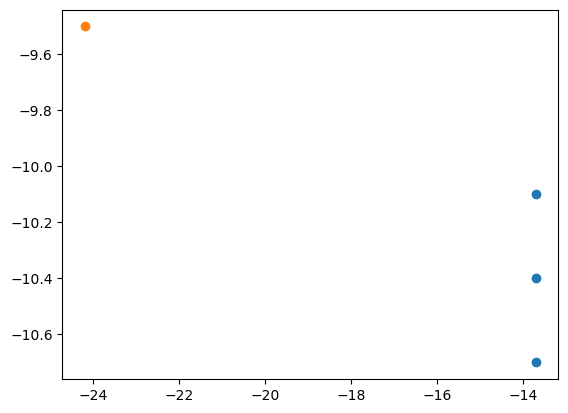

In [140]:
plt.scatter(p1_lat,p1_lon)
plt.scatter(p2_lat,p2_lon)

for simplex in hull1.simplices:

    plt.plot(p1[simplex, 0], p1[simplex, 1], 'k-')

for simplex in hull2.simplices:

    plt.plot(p2[simplex, 0], p2[simplex, 1], 'k-')
plt.scatter(point_p1[0],point_p1[1], color="red")
plt.scatter(point_p2[0],point_p2[1], color="red")

plt.xlim((-26,-10))
plt.ylim((-4,-22))

In [109]:
import numpy as np

   # 30 random points in 2-D

hull = ConvexHull(np.column_stack([p1_lat,p1_lon]))

In [13]:
from sklearn.neighbors import KDTree
import numpy as np
from itertools import chain


def calc_min_distance_between_objs(p1,p2):
    p1 = list(chain.from_iterable(p1))
    p2 = list(chain.from_iterable(p2))
    
    p1_lat = [x.lat for x in p1]
    p1_lon = [x.lon for x in p1]

    p2_lat = [x.lat for x in p2]
    p2_lon = [x.lon for x in p2]

    p1 = np.column_stack([p1_lat,p1_lon])
    p2 = np.column_stack([p2_lat,p2_lon])
    
    tree = KDTree(p1)
    (distances, neighbors) = tree.query(p2, k=1)

    return distances.min()

min_dist_index = np.argmin(distances)
min_dist = distances[min_dist_index][0]

# Punkte a und b für die minimale Distanz
point_p1 = p1[neighbors[min_dist_index][0]]
point_p2 = p2[min_dist_index]

NameError: name 'distances' is not defined

In [183]:
obj2.gridpoints.values

array([list([RotatedGridPoint(lat=-24.200000762939453, lon=-13.399999618530273), RotatedGridPoint(lat=-24.200000762939453, lon=-13.100000381469727), RotatedGridPoint(lat=-24.200000762939453, lon=-12.800000190734863), RotatedGridPoint(lat=-24.200000762939453, lon=-12.5), RotatedGridPoint(lat=-24.200000762939453, lon=-12.199999809265137), RotatedGridPoint(lat=-24.200000762939453, lon=-11.899999618530273), RotatedGridPoint(lat=-24.200000762939453, lon=-11.600000381469727), RotatedGridPoint(lat=-24.200000762939453, lon=-11.300000190734863), RotatedGridPoint(lat=-24.200000762939453, lon=-11.0), RotatedGridPoint(lat=-24.200000762939453, lon=-10.699999809265137), RotatedGridPoint(lat=-24.200000762939453, lon=-10.399999618530273), RotatedGridPoint(lat=-24.200000762939453, lon=-10.100000381469727), RotatedGridPoint(lat=-24.200000762939453, lon=-9.800000190734863), RotatedGridPoint(lat=-24.200000762939453, lon=-9.5), RotatedGridPoint(lat=-24.200000762939453, lon=-9.199999809265137), RotatedGridP

In [ ]:
list(np.zeros(5))
a=IVT_objs_ICON_ERA5[0].history.loc[{'times': IVT_objs_ICON_ERA5[0].times[0]}].values.item()
type(a)

In [ ]:
str(IVT_objs_ICON_ERA5[0].id_.values)

In [169]:
d={}
d["44"]=[1,2,3]


In [79]:
IVT_objs_ICON_ERA5[0].history.loc[{'times': IVT_objs_ICON_ERA5[0].times[0]}]

<xarray.DataArray 'history' ()> Size: 4B
array('', dtype='<U1')
Coordinates:
    times    datetime64[ns] 8B 1998-01-01T01:00:00

In [76]:
IVT_objs_ICON_ERA5 = copy.deepcopy(IVT_objs_ICON_ERA5_bak)        

In [77]:
for i in range(len(IVT_objs_ICON_ERA5)):
     
    history = ('times', np.zeros(len(IVT_objs_ICON_ERA5[i].times)).astype("int"))
    
    IVT_objs_ICON_ERA5[i] = IVT_objs_ICON_ERA5[i].assign(history=history)

In [78]:
IVT_objs_ICON_ERA5[0]

<xarray.Dataset> Size: 2kB
Dimensions:          (times: 23)
Coordinates:
  * times            (times) datetime64[ns] 184B 1979-01-01T01:00:00 ... 1979...
Data variables: (12/13)
    id_              <U1 4B '1'
    exp              object 8B <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 184B 9.171e+05 9.221e+05 ... 7.558e+03
    total_IVT        (times) float32 92B 1.319e+05 1.316e+05 ... 5.222e+03 707.6
    mean_IVT         (times) float32 92B 159.0 157.6 157.8 ... 106.7 102.4 101.1
    max_IVT          (times) float32 92B 252.0 249.8 247.8 ... 118.5 105.4 102.9
    ...               ...
    mass_center_idy  (times) float64 184B 34.62 33.51 32.45 ... 9.702 5.137 7.0
    mass_center_idx  (times) float64 184B 13.25 13.59 13.62 ... 23.45 21.29
    track            (times) object 184B RotatedGridPoint(lat=-5.300000190734...
    speed            (times) float64 184B nan 37.7 34.79 ... 66.32 162.1 93.04
    gridpoints       (times) object 184B [RotatedGridPoint(lat=-11.0, lon=-24...
    history          (times) int64 184B 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0

In [79]:
from sklearn.neighbors import KDTree
import numpy as np
from itertools import chain



def calc_min_distance_between_objs(p1,p2):
    p1 = list(chain.from_iterable(p1))
    p2 = list(chain.from_iterable(p2))
    
    p1_lat = [x.lat for x in p1]
    p1_lon = [x.lon for x in p1]

    p2_lat = [x.lat for x in p2]
    p2_lon = [x.lon for x in p2]

    p1 = np.column_stack([p1_lat,p1_lon])
    p2 = np.column_stack([p2_lat,p2_lon])
    
    tree = KDTree(p1)
    (distances, neighbors) = tree.query(p2, k=1)

    return distances.min()
    
def edit_obj_history(obj_index, obj_close_index, time, type_):

    obj = IVT_objs_ICON_ERA5[obj_index]
    obj_close = IVT_objs_ICON_ERA5[obj_close_index]
    
    obj_id = int(obj.id_.values)
    obj_close_id = int(obj_close.id_.values)

    #print (obj_index)

    #print (f"{obj_index=}")
    #print (f"{obj_close_index=}")
    print (f"{type_=}")
    print (f"{obj_id=}")
    print (f"{obj_close_id=}")

    hist = obj.history
    #hist_sel = hist.loc[{'times': time}].values.item()

    hist_close = obj_close.history
    #hist_close_sel = hist_close.loc[{'times': time}].values.item()

  
    #print (f"{type_}")
    print ("##################")


    if type_=="start":
        
        hist.loc[{'times': time}] =obj_close_id
        hist_close.loc[{'times': time}] =-obj_id

        #obj.history.loc[{'times': time}] = assign_value(hist_sel,obj_close_id)
        #obj_close.history.loc[{'times': time}] =  assign_value(hist_close_sel, -obj_id)

    elif  type_=="end":

        hist.loc[{'times': time}] =-obj_close_id
        hist_close.loc[{'times': time}] =obj_id
        
        #obj.history.loc[{'times': time}] = assign_value(hist_sel,-obj_close_id)
        #obj_close.history.loc[{'times': time}] = assign_value(hist_close_sel, obj_id)

    obj["history"] = hist
    obj_close["history"] = hist_close


    IVT_objs_ICON_ERA5[obj_index]=obj
    IVT_objs_ICON_ERA5[obj_close_index]=obj_close




In [80]:
objs_closest = {}

for type_ in ("start","end"):
    if type_=="start":
        all_objs =  IVT_objs_ICON_ERA5.seltimesteps(slice(0,1))

    if type_=="end":
        all_objs =  IVT_objs_ICON_ERA5.seltimesteps(slice(-1,None))

    for obj in all_objs:
    
        time = obj.times
        objs_at_time =IVT_objs_ICON_ERA5.sel_by_time(time.values[0])
    
        for obj2 in objs_at_time:
            
            obj2=obj2.sel(times=time)
            distance = calc_min_distance_between_objs(obj.gridpoints.values,obj2.gridpoints.values)
            if distance < 3 and distance != 0:
                objs_closest[distance] = obj2
                #objs_closest.append(obj2)
                
        if not objs_closest:
            continue
        #objs_closest =[x for x in objs_closest if x.total_IVT>obj.total_IVT]
        objs_closest = {key: value for key, value in objs_closest.items() if value.total_IVT>obj.total_IVT}

        if not objs_closest:
            continue
        #largest_closest_obj = max(objs_closest,key=lambda x: x.total_IVT)
        #key = max(objs_closest.keys(),key=lambda x:x.total_IVT)
        largest_closest_obj= objs_closest[min(objs_closest.keys())]
                
        obj_index = IVT_objs_ICON_ERA5.get_index_by_id(obj.id_)
        largest_closest_obj_index = IVT_objs_ICON_ERA5.get_index_by_id(largest_closest_obj.id_)
        print (type(time.values[0]))
        edit_obj_history(obj_index,largest_closest_obj_index, time.values[0], type_ = type_)
                #print (distance) 
    


<class 'numpy.datetime64'>
type_='start'
obj_id=8
obj_close_id=7
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=10
obj_close_id=400
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=24
obj_close_id=414
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=50
obj_close_id=49
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=82
obj_close_id=466
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=87
obj_close_id=86
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=90
obj_close_id=488
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=100
obj_close_id=99
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=101
obj_close_id=502
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=114
obj_close_id=534
##################
<class 'numpy.datetime64'>
type_='start'
obj_id=139
obj_close_id=561
##################
<class 'numpy.datetime64'>
type_='start'
obj_

In [20]:
#max(objs_closest,key=lambda x: x.total_IVT)
#{key: value for key, value in d.items() if value.total_IVT>value.total_IVT}
objs_closest[min(objs_closest.keys())]

<xarray.Dataset> Size: 92B
Dimensions:          (times: 1)
Coordinates:
  * times            (times) datetime64[ns] 8B 1979-01-02T23:00:00
Data variables: (12/13)
    id_              <U1 4B '7'
    exp              object 8B <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 8B 1.587e+04
    total_IVT        (times) float32 4B 2.663e+03
    mean_IVT         (times) float32 4B 166.4
    max_IVT          (times) float32 4B 177.5
    ...               ...
    mass_center_idy  (times) float64 8B 3.938
    mass_center_idx  (times) float64 8B 5.438
    track            (times) object 8B RotatedGridPoint(lat=26.79999923706054...
    speed            (times) float64 8B 23.74
    gridpoints       (times) object 8B [RotatedGridPoint(lat=26.5, lon=-0.200...
    history          (times) int64 8B 0

In [18]:
objs_closest#.values()

{1.697056848044929: <xarray.Dataset> Size: 92B
 Dimensions:          (times: 1)
 Coordinates:
   * times            (times) datetime64[ns] 8B 1979-01-02T23:00:00
 Data variables: (12/13)
     id_              <U1 4B '7'
     exp              object 8B <class 'src.Experiments_infos.ERA5'>
     size             (times) float64 8B 1.587e+04
     total_IVT        (times) float32 4B 2.663e+03
     mean_IVT         (times) float32 4B 166.4
     max_IVT          (times) float32 4B 177.5
     ...               ...
     mass_center_idy  (times) float64 8B 3.938
     mass_center_idx  (times) float64 8B 5.438
     track            (times) object 8B RotatedGridPoint(lat=26.79999923706054...
     speed            (times) float64 8B 23.74
     gridpoints       (times) object 8B [RotatedGridPoint(lat=26.5, lon=-0.200...
     history          (times) int64 8B 0}

In [205]:
import xarray as xr
import pandas as pd

# Beispiel-Daten erstellen
times = pd.date_range('2023-01-01', periods=5)
dx = xr.Dataset(
    {'history': (['times'], [0, 0, 0, 0, 0])},
    coords={'times': times}
)

# Den neuen Wert für den Zeitpunkt time_start setzen
time_start = '2023-01-03'
new_value = [1, 2]

# Sicherstellen, dass der Wert einstellbar ist (z.B. Umwandlung in Objekt-Datentyp)
dx['history'] = dx['history'].astype(object)

# Den neuen Wert zuweisen
dx['history'].loc[{'times': time_start}] = new_value

# Ergebnis anzeigen
print(dx)

ValueError: shape mismatch: value array of shape (2,) could not be broadcast to indexing result with 0 dimensions

In [66]:
IVT_objs_ICON_ERA5.get_index_by_id(805)
#IVT_objs_ICON_ERA5.index(IVT_objs_ICON_ERA5[8])

727

In [128]:
IVT_objs_ICON_ERA5[0].history.loc[{'times': time_start}] =55

In [67]:
IVT_objs_ICON_ERA5[727]


<xarray.Dataset> Size: 29kB
Dimensions:          (times: 365)
Coordinates:
  * times            (times) datetime64[ns] 3kB 1979-06-13T11:00:00 ... 1979-...
Data variables: (12/13)
    id_              <U3 12B '805'
    exp              object 8B <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 3kB 1.1e+05 1.36e+05 ... 1.111e+03
    total_IVT        (times) float32 1kB 2.943e+04 3.682e+04 ... 1.142e+03 185.7
    mean_IVT         (times) float32 1kB 288.6 292.2 296.2 ... 198.2 190.4 185.7
    max_IVT          (times) float32 1kB 377.2 390.4 375.0 ... 222.1 203.2 185.7
    ...               ...
    mass_center_idy  (times) float64 3kB 126.8 125.9 125.3 ... 88.2 88.17 88.0
    mass_center_idx  (times) float64 3kB 1.598 1.984 2.327 ... 191.3 191.7 192.0
    track            (times) object 3kB RotatedGridPoint(lat=13.8999996185302...
    speed            (times) float64 3kB nan 32.7 23.21 ... 17.16 11.99 12.14
    gridpoints       (times) object 3kB [RotatedGridPoint(lat=10.300000190734...
    history          (times) int64 3kB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0

In [65]:
#data.history.sel(times=time_start)=4
IVT_objs_ICON_ERA5[817]

<xarray.Dataset> Size: 1kB
Dimensions:          (times: 16)
Coordinates:
  * times            (times) datetime64[ns] 128B 1979-06-28T23:00:00 ... 1979...
Data variables: (12/13)
    id_              <U3 12B '895'
    exp              object 8B <class 'src.Experiments_infos.ERA5'>
    size             (times) float64 128B 3.123e+05 2.868e+05 ... 9.051e+04
    total_IVT        (times) float32 64B 1.052e+05 9.69e+04 ... 2.583e+04
    mean_IVT         (times) float32 64B 320.9 321.9 320.3 ... 283.8 286.4 283.9
    max_IVT          (times) float32 64B 435.2 428.7 421.9 ... 326.8 328.4 341.2
    ...               ...
    mass_center_idy  (times) float64 128B 22.1 21.81 21.45 ... 7.74 7.074 6.901
    mass_center_idx  (times) float64 128B 10.86 9.841 8.873 ... 4.326 3.176
    track            (times) object 128B RotatedGridPoint(lat=31.0, lon=-26.6...
    speed            (times) float64 128B nan 34.45 33.64 ... 37.96 39.61 37.9
    gridpoints       (times) object 128B [RotatedGridPoint(lat=28.0, lon=-29....
    history          (times) int64 128B 893 0 0 0 0 0 0 0 0 0 0 0 0 0 0 -889

In [220]:
import xarray as xr
import pandas as pd

# Beispiel-Daten erstellen
times = pd.date_range('2023-01-01', periods=5)
dx = xr.Dataset(
    {'data': (['times'], [0, 0, 0, 0, 0])},
    coords={'times': times}
)

# Eine zusätzliche history-Variable hinzufügen und auf den Objektdatentyp setzen
dx['history'] = (('times'), [None] * len(times))
dx['history'] = dx['history'].astype(object)

# Wert zu einem bestimmten Zeitpunkt setzen
time_start = '2023-01-03'
new_value = [1, 2]

# Sicherstellen, dass der Zeitindex vorhanden ist
if pd.Timestamp(time_start) in dx['times'].values:
    dx['history'].loc[{'times': time_start}] = new_value

# Ergebnis anzeigen
print(dx)
print(dx['history'].values)

ValueError: shape mismatch: value array of shape (2,) could not be broadcast to indexing result with 0 dimensions

In [221]:
import xarray as xr
import pandas as pd

# Beispiel-Daten erstellen
times = pd.date_range('2023-01-01', periods=5)
dx = xr.Dataset(
    {'data': (['times'], [0, 0, 0, 0, 0])},
    coords={'times': times}
)

# Eine zusätzliche history-Variable hinzufügen und auf den Objektdatentyp setzen
dx['history'] = (('times'), [None] * len(times))
dx['history'] = dx['history'].astype(object)

# Wert zu einem bestimmten Zeitpunkt setzen
time_start = '2023-01-03'
new_value = [1, 2]

# Zeitindex finden
time_index = dx['times'].indexes['times'].get_loc(pd.Timestamp(time_start))

# Wert direkt zuweisen
dx['history'].values[time_index] = new_value

# Ergebnis anzeigen
print(dx)
print(dx['history'].values)

<xarray.Dataset> Size: 120B
Dimensions:  (times: 5)
Coordinates:
  * times    (times) datetime64[ns] 40B 2023-01-01 2023-01-02 ... 2023-01-05
Data variables:
    data     (times) int64 40B 0 0 0 0 0
    history  (times) object 40B None None [1, 2] None None
[None None list([1, 2]) None None]


In [126]:
calc_min_distance_between_objs(s[2],s[4])

history = {}
for obj in IVT_objs_ICON_ERA5:
    
    key = str(obj.id_.values.item())
    value = len(obj.times)*[0]

    history[key]=value
history

10.517129859658736

In [ ]:
def edit_obj_history(obj_index, obj_close_index, time, type_):

    obj = IVT_objs_ICON_ERA5[obj_index]
    obj_close = IVT_objs_ICON_ERA5[obj_close_index]
    
    obj_id = str(obj.id_.values)
    obj_close_id = str(obj_close.id_.values)

    #print (obj_index)

    print (f"{obj_index=}")
    print (f"{obj_close_index=}")

    hist = obj.history
    hist_sel = hist.loc[{'times': time}].values.item()

    hist_close = obj_close.history
    hist_close_sel = hist_close.loc[{'times': time}].values.item()

  
    #print (f"{type_}")
    print ("##################")


    if type_=="start":
        
        hist.loc[{'times': time}] =assign_value(hist_sel,obj_close_id)
        hist_close.loc[{'times': time}] =assign_value(hist_close_sel,"-"+obj_id)

        #obj.history.loc[{'times': time}] = assign_value(hist_sel,obj_close_id)
        #obj_close.history.loc[{'times': time}] =  assign_value(hist_close_sel, -obj_id)

    elif  type_=="end":

        hist.loc[{'times': time}] =assign_value(hist_sel,"-"+obj_close_id)
        hist_close.loc[{'times': time}] =assign_value(hist_close_sel,obj_id)
        
        #obj.history.loc[{'times': time}] = assign_value(hist_sel,-obj_close_id)
        #obj_close.history.loc[{'times': time}] = assign_value(hist_close_sel, obj_id)

    obj["history"] = hist
    obj_close["history"] = hist_close


    IVT_objs_ICON_ERA5[obj_index]=obj
    IVT_objs_ICON_ERA5[obj_close_index]=obj_close